In [6]:
import os
import zipfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader

import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

from tqdm import notebook
from pydub import AudioSegment
from sklearn.preprocessing import LabelEncoder

print(torch.__version__)
print(torchaudio.__version__)

1.13.1+cu117
0.13.1+cu117


In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [7]:
# http://accent.gmu.edu/searchsaa.php?function=detail&speakerid=304

In [8]:
! pwd

/home/mark/accent_recognition


In [9]:
with zipfile.ZipFile("recordings_wav.zip", 'r') as zip_ref:
    zip_ref.extractall("recordings_wav")

BadZipFile: File is not a zip file

In [5]:
! ls recordings/

ls: cannot access 'recordings/': No such file or directory


In [7]:
# files_mp3 = [f for f in listdir("recordings/") if isfile(join("recordings", f))]

# for f in files_mp3:
#     src = join("recordings/", f)
#     dst = join("recordings_wav/", f.replace('mp3', 'wav'))
    
#     sound = AudioSegment.from_mp3(src)
#     sound.export(dst, format="wav")

In [8]:
files_wav = [f for f in os.listdir("recordings_wav/") if os.path.isfile(join("recordings_wav", f))]
files_wav

['russian12.wav',
 'nepali2.wav',
 'armenian4.wav',
 'amharic15.wav',
 'english101.wav',
 'romanian6.wav',
 'german19.wav',
 'french14.wav',
 'mandarin3.wav',
 'english7.wav',
 'english115.wav',
 'miskito8.wav',
 'german25.wav',
 'french28.wav',
 'german31.wav',
 'vietnamese17.wav',
 'english129.wav',
 'cantonese9.wav',
 'arabic96.wav',
 'arabic82.wav',
 'korean6.wav',
 'portuguese13.wav',
 'uyghur2.wav',
 'swedish19.wav',
 'tswana2.wav',
 'spanish162.wav',
 'english465.wav',
 'arabic55.wav',
 'english303.wav',
 'taiwanese4.wav',
 'mandarin53.wav',
 'mandarin47.wav',
 'arabic41.wav',
 'english317.wav',
 'turkish28.wav',
 'english471.wav',
 'english459.wav',
 'croatian2.wav',
 'arabic69.wav',
 'turkish14.wav',
 'faroese1.wav',
 'ukrainian8.wav',
 'spanish39.wav',
 'yapese1.wav',
 'spanish11.wav',
 'english288.wav',
 'german1.wav',
 'english511.wav',
 'english277.wav',
 'japanese5.wav',
 'english263.wav',
 'english505.wav',
 'kurdish1.wav',
 'dutch41.wav',
 'korean17.wav',
 'mongolian4.w

In [9]:
from IPython.display import Audio, display
import matplotlib.pyplot as plt

def play_audio(waveform, sample_rate):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    if num_channels == 1:
        display(Audio(waveform[0], rate=sample_rate))
    elif num_channels == 2:
        display(Audio((waveform[0], waveform[1]), rate=sample_rate))
    else:
        raise ValueError("Waveform with more than 2 channels are not supported.")

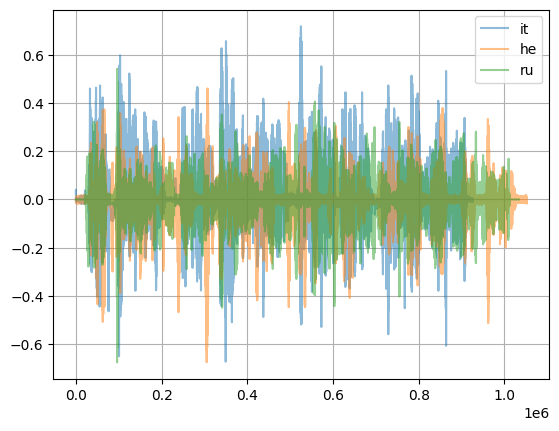

In [10]:
waveform_it, sample_rate_it = torchaudio.load('recordings_wav/italian3.wav', format='wav')
waveform_he, sample_rate_he = torchaudio.load('recordings_wav/yiddish3.wav', format='wav')
waveform_ru, sample_rate_ru = torchaudio.load('recordings_wav/russian3.wav', format='wav')

play_audio(waveform_it, sample_rate_it)
play_audio(waveform_he, sample_rate_he)
play_audio(waveform_ru, sample_rate_ru)

plt.plot(waveform_it.t().numpy(), alpha=0.5, label='it')
plt.plot(waveform_he.t().numpy(), alpha=0.5, label='he')
plt.plot(waveform_ru.t().numpy(), alpha=0.5, label='ru')
plt.grid()
plt.legend()

In [11]:
sample_rate_it, sample_rate_he, sample_rate_ru

(44100, 44100, 44100)

In [ ]:
duration = np.random.uniform(low=10)

In [21]:
sample_rate = 44100

sample_rate * 5, waveform.size(1)

(220500, 1188476)

In [51]:
n_sec = 5
duration = np.random.randint(low=sample_rate * n_sec, high=waveform.size(1))
duration

602762

In [52]:
duration / sample_rate

13.668072562358276

In [53]:
waveform.size(1) - duration

585714

In [54]:
ts_start = np.random.randint(low=0, high=waveform.size(1) - duration)
ts_end = ts_start + duration

In [55]:
ts_start / sample_rate, ts_end / sample_rate

(6.026961451247166, 19.695034013605444)

In [58]:
waveform, sample_rate = torchaudio.load('recordings_wav/italian10.wav', format='wav')

play_audio(waveform, sample_rate)
play_audio(waveform[:, ts_start:ts_end], sample_rate)

In [13]:
new_sample_rate = 10_000
waveform = torchaudio.functional.resample(waveform, orig_freq=sample_rate, new_freq=new_sample_rate)

play_audio(waveform[:, :100_000], new_sample_rate)

In [181]:
from torchaudio.utils import download_asset

SAMPLE_WAV = download_asset("tutorial-assets/steam-train-whistle-daniel_simon.wav")
SAMPLE_RIR = download_asset("tutorial-assets/Lab41-SRI-VOiCES-rm1-impulse-mc01-stu-clo-8000hz.wav")
SAMPLE_SPEECH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042-8000hz.wav")
SAMPLE_NOISE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-rm1-babb-mc01-stu-clo-8000hz.wav")

In [182]:
SAMPLE_WAV

'/Users/markliubimov/.cache/torch/hub/torchaudio/tutorial-assets/steam-train-whistle-daniel_simon.wav'

In [183]:
# Load the data
waveform1, sample_rate1 = torchaudio.load(SAMPLE_SPEECH)

In [184]:
play_audio(waveform1, sample_rate1)

In [185]:
waveform2, sample_rate2 = torchaudio.sox_effects.apply_effects_tensor(waveform1, sample_rate1, [['pitch', '15']])
play_audio(waveform2, sample_rate2)

In [198]:
waveform_speech, sample_rate_speech = torchaudio.load(SAMPLE_SPEECH)
waveform_noise, sample_rate_noise = torchaudio.load(SAMPLE_NOISE)
waveform_noise = noise[:, :waveform_speech.shape[1]]

# speech_rms = speech.norm(p=2)
# noise_rms = noise.norm(p=2)

# snr_dbs = [20, 10, 3]
# noisy_speeches = []
# for snr_db in snr_dbs:
#     snr = 10 ** (snr_db / 20)
#     scale = snr * noise_rms / speech_rms
#     noisy_speeches.append((scale * speech + noise) / 2)

In [199]:
play_audio(waveform_noise, sample_rate_noise)

In [189]:
waveform_speech.norm()

8000

In [161]:
MAX_WAVE_LENGTH = 500_000
SAMPLE_RATE = 10_000

class AccentData(Dataset):
    def __init__(self, files=[], sample_rate=SAMPLE_RATE, max_wave_length=MAX_WAVE_LENGTH, min_sec=5, transforms=[]):
        self.X = []
        self.Y = []
        self.label_encoder = LabelEncoder()
        # self.mel_spectrogram = MelSpectrogram(sample_rate=new_sample_rate, n_mels=32, n_fft=400)
        self.sample_rate = SAMPLE_RATE
        self.max_wave_length = MAX_WAVE_LENGTH
        self.transforms = transforms
        self.files = files
        self.min_sec = min_sec
        
        for f in notebook.tqdm(self.files):
            waveform, sample_rate = torchaudio.load(os.path.join("recordings_wav", f), format='wav')
            x = F.resample(waveform, orig_freq=sample_rate, new_freq=self.sample_rate)[:, :self.max_wave_length]
            y = "".join([item for item in f.replace(".wav", "") if not item.isdigit()])
            self.X.append(x.T)
            if y == "english":
                self.Y.append(y)
            else:
                self.Y.append("non_english")
        self.Y = self.label_encoder.fit_transform(self.Y)
        self.n_classes = len(self.label_encoder.classes_)
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        X = self.X[idx].detach().clone()
        Y = self.Y[idx]
        for transform in self.transforms:
            if transform == "cropp":
                X = cropp_transformation(waveform=X, sample_rate=self.sample_rate, min_sec=self.min_sec)
            elif transform == "noize":
                # TBD
                X = func()
        return X, X.size(0), Y

In [162]:
def cropp_transformation(waveform=[], sample_rate=SAMPLE_RATE, min_sec=5):
    duration = np.random.randint(low=sample_rate * n_sec, high=waveform.size(0))
    ts_start = np.random.randint(low=0, high=waveform.size(0) - duration)
    ts_end = ts_start + duration
    return waveform[ts_start:ts_end, :]

In [163]:
accent_data = AccentData(
    files=files_wav, 
    sample_rate=SAMPLE_RATE, 
    max_wave_length=MAX_WAVE_LENGTH, 
    min_sec=5,
    transforms=["cropp"]
)

  0%|          | 0/2138 [00:00<?, ?it/s]

In [ ]:
'/home/mark/.pyenv/versions/3.9.16/bin' which is not on PATH.

In [49]:
N_CHANNELS = 1

class AccentModel(nn.Module):
    def __init__(self, hidden_dims, channel_dims, n_classes):
        super(AccentModel, self).__init__()
        self.hidden_dims = hidden_dims
        self.channel_dims = channel_dims
        self.output_dims = n_classes
        
        self.lstm = nn.LSTM(
            input_size=self.channel_dims, 
            hidden_size=self.hidden_dims,
            batch_first=True, 
            bidirectional=False
        )
        self.fc = nn.Linear(in_features=self.hidden_dims, out_features=self.output_dims)

        self.softmax = nn.Softmax(dim=1)
        
    def forward(self, x, x_lens):
        packed_input = nn.utils.rnn.pack_padded_sequence(x, x_lens, batch_first=True, enforce_sorted=False)
        nn.utils.rnn.packed_output, _ = self.lstm(packed_input)
        x, _ = nn.utils.rnn.pad_packed_sequence(packed_output, batch_first=True)
        x = self.fc(x[:, -1, :])
        x = self.softmax(x)
        
        return x

In [50]:
def custom_collate_fn(data):

    X_lengths = torch.tensor([item[1] for item in data])
    X = [torch.Tensor(item[0]) for item in data]
    X = nn.utils.rnn.pad_sequence(X, padding_value=0, batch_first=True)
    Y = torch.tensor([item[2] for item in data])  

    return X, X_lengths, Y

accent_loader = DataLoader(dataset=accent_data, collate_fn=custom_collate_fn, batch_size=16)

In [51]:
item = next(iter(accent_loader))

In [52]:
item[0].size()

torch.Size([16, 500000, 1])

In [53]:
# for X, X_lengths, Y in accent_loader:
#     print(X.size(), X_lengths.size(), Y.size())

In [54]:
accent_model = AccentModel(hidden_dims=50, channel_dims=1, n_classes=accent_data.n_classes)
accent_loader = DataLoader(dataset=accent_data, collate_fn=custom_collate_fn, batch_size=16)
optimizer = Adam(params=accent_model.parameters())
criterion = nn.CrossEntropyLoss()

In [55]:
sum(p.numel() for p in accent_model.parameters() if p.requires_grad)

10702

In [ ]:
N_EPOCHS = 1
losses = []
acc = []

for epoch in notebook.tqdm(range(N_EPOCHS)):
    loss_tmp, acc_tmp = 0, 0
    n_tmp = 0
    
    for i, (inputs, lens, targets_true) in enumerate(notebook.tqdm(accent_loader)):
        optimizer.zero_grad()
        targets_pred = accent_model(inputs, lens)
        loss = criterion(targets_pred, targets_true)
        loss.backward()
        optimizer.step()
        
        n_tmp += targets_true.size(0)
        loss_tmp += loss.detach().numpy()
        acc_tmp += (targets_true == targets_pred.max(dim=1)[1]).sum().item()
        
    losses.append(loss_tmp / n_tmp)
    acc.append(acc_tmp / n_tmp)
    print(losses[-1], acc[-1])

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

In [ ]:
targets_pred

In [33]:
accent_data.label_encoder.classes_

array(['english', 'non_english'], dtype='<U11')

In [36]:
inputs.shape

torch.Size([10, 500, 1])

In [37]:
acc

[0.7086061739943873]

In [38]:
losses

[0.037540802841882374]

In [71]:
df[df['label'] != 'english']['label'].value_counts(normalize=True)

spanish        0.103913
arabic         0.065427
mandarin       0.041693
french         0.040411
korean         0.033355
                 ...   
nandi          0.000641
nama           0.000641
mortlockese    0.000641
moore          0.000641
zulu           0.000641
Name: label, Length: 199, dtype: float64

In [60]:
accent_data.label_encoder.inverse_transform([109])

array(['mandarin'], dtype='<U14')

In [33]:
sample_rates = []
for f in notebook.tqdm(files_wav):
    waveform, sample_rate = torchaudio.load(join("recordings_wav", f), format='wav')
    sample_rates.append(sample_rate)
    
sum(sample_rates) / len(sample_rate)

  0%|          | 0/2138 [00:00<?, ?it/s]

TypeError: object of type 'int' has no len()

In [35]:
sum(sample_rates) / len(sample_rates)

43608.16183348924

In [37]:
min(sample_rates), max(sample_rates)

(16000, 48000)

In [38]:
import numpy as np

In [42]:
np.quantile(sample_rates, 0.05)

44100.0

In [14]:
class AudioUtil():
    # ----------------------------
    # Load an audio file. Return the signal as a tensor and the sample rate
    # ----------------------------
    @staticmethod
    def open(audio_file):
        sig, sr = torchaudio.load(audio_file)
        return (sig, sr)
    
    # ----------------------------
    # Convert the given audio to the desired number of channels
    # ----------------------------
#     @staticmethod
#     def rechannel(aud, new_channel):
#         sig, sr = aud
#         if (sig.shape[0] == new_channel):
#           # Nothing to do
#           return aud
#         if (new_channel == 1):
#           # Convert from stereo to mono by selecting only the first channel
#           resig = sig[:1, :]
#         else:
#           # Convert from mono to stereo by duplicating the first channel
#           resig = torch.cat([sig, sig])

#         return ((resig, sr))
    # ----------------------------
    # Since Resample applies to a single channel, we resample one channel at a time
    # ----------------------------
    @staticmethod
    def resample(aud, newsr):
        sig, sr = aud

        if (sr == newsr):
          # Nothing to do
            return aud

        num_channels = sig.shape[0]
        # Resample first channel
        resig = torchaudio.transforms.Resample(sr, newsr)(sig[:1,:])
        if (num_channels > 1):
            # Resample the second channel and merge both channels
            retwo = torchaudio.transforms.Resample(sr, newsr)(sig[1:,:])
            resig = torch.cat([resig, retwo])

        return ((resig, newsr))
    

    # ----------------------------
    # Pad (or truncate) the signal to a fixed length 'max_ms' in milliseconds
    # ----------------------------
    @staticmethod
    def pad_trunc(aud, max_ms):
        sig, sr = aud
        num_rows, sig_len = sig.shape
        max_len = sr//1000 * max_ms

        if (sig_len > max_len):
            # Truncate the signal to the given length
            sig = sig[:,:max_len]
        elif (sig_len < max_len):
            # Length of padding to add at the beginning and end of the signal
            pad_begin_len = random.randint(0, max_len - sig_len)
            pad_end_len = max_len - sig_len - pad_begin_len

        # Pad with 0s
        pad_begin = torch.zeros((num_rows, pad_begin_len))
        pad_end = torch.zeros((num_rows, pad_end_len))

        sig = torch.cat((pad_begin, sig, pad_end), 1)

        return (sig, sr)

In [15]:
from torch.utils.data import DataLoader, Dataset, random_split
import torchaudio

# ----------------------------
# Sound Dataset
# ----------------------------
class SoundDS(Dataset):
    def __init__(self, df, data_path):
        self.df = df
        self.data_path = str(data_path)
        self.duration = 4000
        self.sr = 44100
        self.channel = 2
        self.shift_pct = 0.4
            
    # ----------------------------
    # Number of items in dataset
    # ----------------------------
    def __len__(self):
        return len(self.df)    

    # ----------------------------
    # Get i'th item in dataset
    # ----------------------------
    def __getitem__(self, idx):
        # Absolute file path of the audio file - concatenate the audio directory with
        # the relative path
        audio_file = self.data_path + self.df.loc[idx, 'relative_path']
        # Get the Class ID
        class_id = self.df.loc[idx, 'classID']

        aud = AudioUtil.open(audio_file)
        # Some sounds have a higher sample rate, or fewer channels compared to the
        # majority. So make all sounds have the same number of channels and same 
        # sample rate. Unless the sample rate is the same, the pad_trunc will still
        # result in arrays of different lengths, even though the sound duration is
        # the same.
        reaud = AudioUtil.resample(aud, self.sr)
        rechan = AudioUtil.rechannel(reaud, self.channel)

        dur_aud = AudioUtil.pad_trunc(rechan, self.duration)
        shift_aud = AudioUtil.time_shift(dur_aud, self.shift_pct)
        sgram = AudioUtil.spectro_gram(shift_aud, n_mels=64, n_fft=1024, hop_len=None)
        aug_sgram = AudioUtil.spectro_augment(sgram, max_mask_pct=0.1, n_freq_masks=2, n_time_masks=2)

        return aug_sgram, class_id

In [16]:
# class AccentModel(torch.nn.Module):
#     def __init__(self):
#         super(AccentModel, self).__init__()
#         self.linear1 = torch.nn.Linear(in_features=wave_length, out_features=5_000)
#         self.activation1 = torch.nn.ReLU()
#         self.linear2 = torch.nn.Linear(in_features=5_000, out_features=1_000)
#         self.activation2 = torch.nn.ReLU()
#         self.linear3 = torch.nn.Linear(in_features=1_000, out_features=n_classes)
#         self.softmax = torch.nn.Softmax(dim=1)
        
#     def forward(self, x):
#         x = self.linear1(x)
#         x = self.activation1(x)
#         x = self.linear2(x)
#         x = self.activation2(x)
#         x = self.linear3(x)
#         x = self.softmax(x)
#         return x